In [1]:
# Summary statistics and visuals for Neurofinder training datasets.
%load_ext autoreload
%autoreload 2
%matplotlib inline
from __future__ import print_function
from glob import glob
from pprint import pprint
import json
import matplotlib.pyplot as plt
import pandas as pd
import sys; sys.path.append('..')

from deepcalcium.datasets.nf import nf_load_hdf5
from deepcalcium.utils.visuals import mask_outlines

DATASETS_DIR = '/home/kzh/.deep-calcium-datasets/'
print('Done')

Done


In [4]:
# Import datasets as HDF5 files. This will also download and unzip
# the datasets if they are not already on the machine.
datasets = nf_load_hdf5('all_train', datasets_dir=DATASETS_DIR)
for ds in datasets:
    name = ds.attrs['name']
    nb_images = ds.get('series/raw').shape[0]
    nb_neurons = ds.get('masks/raw').shape[0]
    resolution = str(ds.get('series/raw').shape[1:])
    print('%s: %d images, %d neurons, %s resolution' % (name, nb_images, nb_neurons, resolution))
    ds.close()
print('Done')

/home/kzh/.deep-calcium-datasets//neurofinder.00.00/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.01/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.02/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.03/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.04/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.05/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.06/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.07/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.08/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.09/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.10/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.11/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.01.00/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.01.01/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.02.00/dataset.hdf5
/home/kzh/.deep-calcium-d

In [5]:
# Info.json file for each dataset.
info_fnames = sorted(glob('%s/neurofinder*/info.json' % DATASETS_DIR))
rows = []
for fname in info_fnames:
    name = fname.split('/')[-2]
    f = open(fname, 'r'); info = json.load(f); f.close()
    cols = ['name'] + sorted(info.keys())
    vals = [name] + [str(info[k]) for k in sorted(info.keys())]
    rows.append(vals)

df = pd.DataFrame(rows, columns=cols)
df

,name,animal,animal-state,contributors,depth-microns,dimensions,experiment,id,indicator,lab,location,method,pixels-per-micron,rate-hz,region
0,neurofinder.00.00.test,Mouse,Awake head-fixed,[u'Simon Peron'],144,"[512, 512, 3068]",Two alternative forced choice pole detection,an229717_2013_12_02_fov_03002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
1,neurofinder.00.00,Mouse,Awake head-fixed,[u'Simon Peron'],196,"[512, 512, 3024]",Two alternative forced choice pole detection,an229716_2013_12_01_fov_04002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
2,neurofinder.00.01.test,Mouse,Awake head-fixed,[u'Simon Peron'],156,"[512, 512, 3209]",Two alternative forced choice pole detection,an229719_2013_12_01_fov_03002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
3,neurofinder.00.01,Mouse,Awake head-fixed,[u'Simon Peron'],242,"[512, 512, 3048]",Two alternative forced choice pole detection,an229716_2013_12_01_fov_05002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
4,neurofinder.00.02,Mouse,Awake head-fixed,[u'Simon Peron'],285,"[512, 512, 3080]",Two alternative forced choice pole detection,an229716_2013_12_02_fov_06002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
5,neurofinder.00.03,Mouse,Awake head-fixed,[u'Simon Peron'],328,"[512, 512, 3052]",Two alternative forced choice pole detection,an229716_2013_12_01_fov_07002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
6,neurofinder.00.04,Mouse,Awake head-fixed,[u'Simon Peron'],186,"[512, 512, 3137]",Two alternative forced choice pole detection,an229717_2013_12_01_fov_04002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
7,neurofinder.00.05,Mouse,Awake head-fixed,[u'Simon Peron'],222,"[512, 512, 3755]",Two alternative forced choice pole detection,an229717_2013_12_02_fov_05002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
8,neurofinder.00.06,Mouse,Awake head-fixed,[u'Simon Peron'],254,"[512, 512, 3107]",Two alternative forced choice pole detection,an229717_2013_12_02b_fov_06002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
9,neurofinder.00.07,Mouse,Awake head-fixed,[u'Simon Peron'],292,"[512, 512, 3110]",Two alternative forced choice pole detection,an229717_2013_12_01_fov_07002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1


/home/kzh/.deep-calcium-datasets//neurofinder.00.00/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.00.test/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.01/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.01.test/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.02/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.03/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.04/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.05/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.06/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.07/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.08/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.09/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.10/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.00.11/dataset.hdf5
/home/kzh/.deep-calcium-datasets//neurofinder.01.00/dataset.hdf5
/home/kzh/.deep

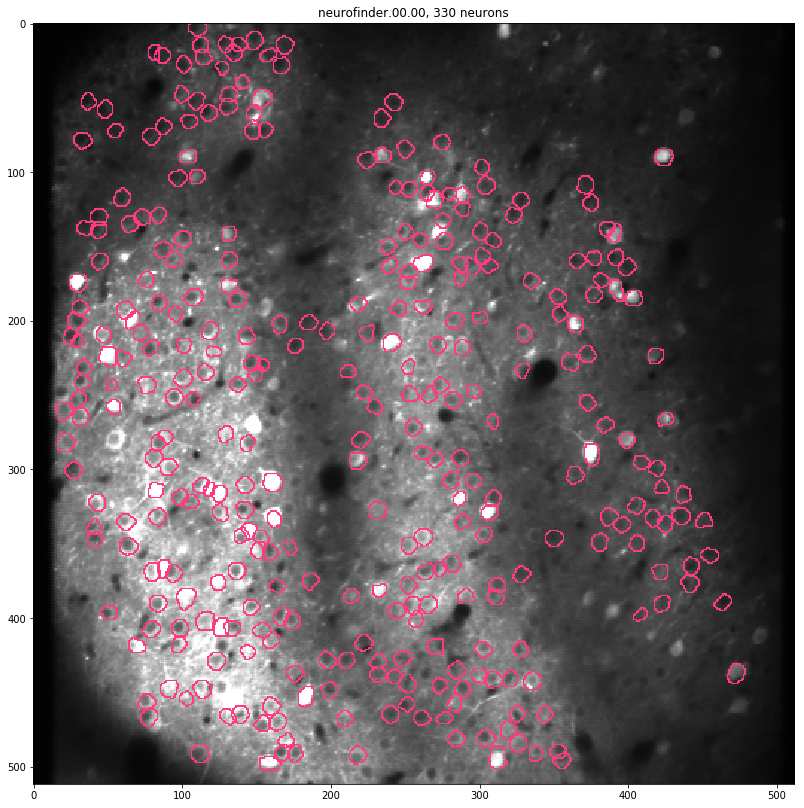

neurofinder.00.00.test


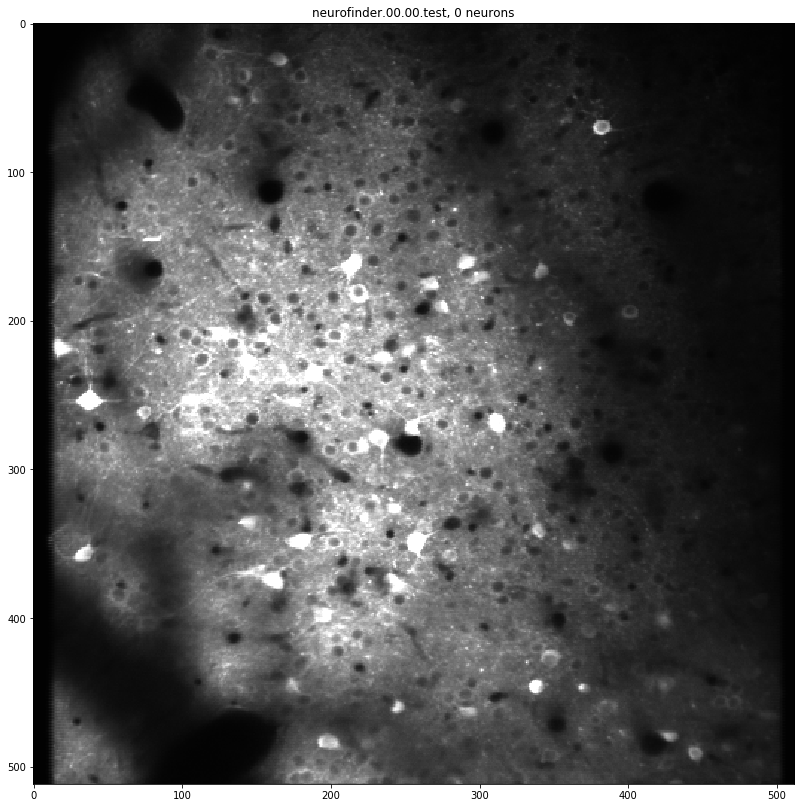

neurofinder.00.01


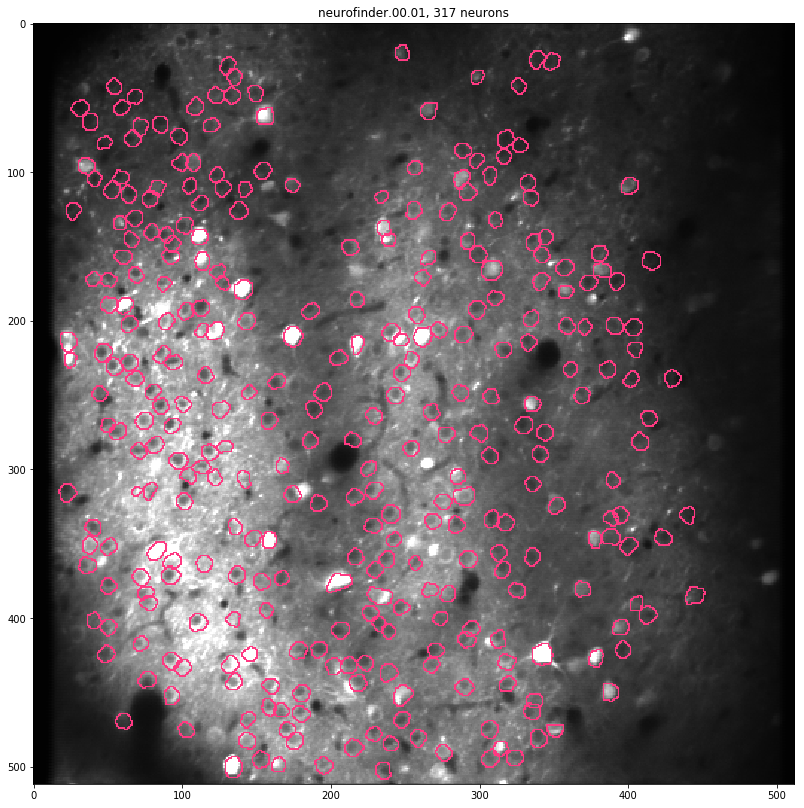

neurofinder.00.01.test


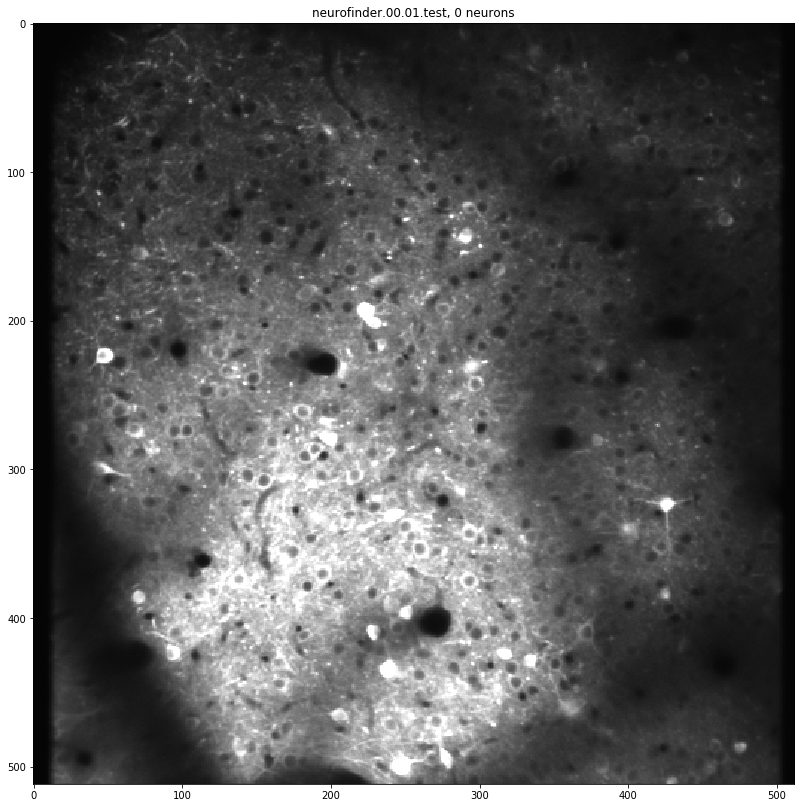

neurofinder.00.02


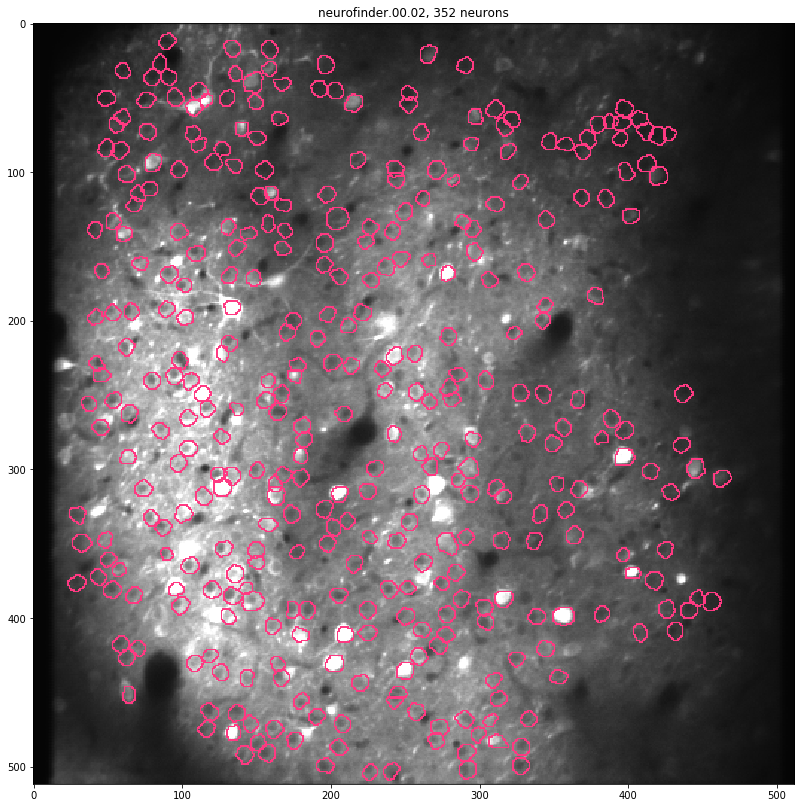

neurofinder.00.03


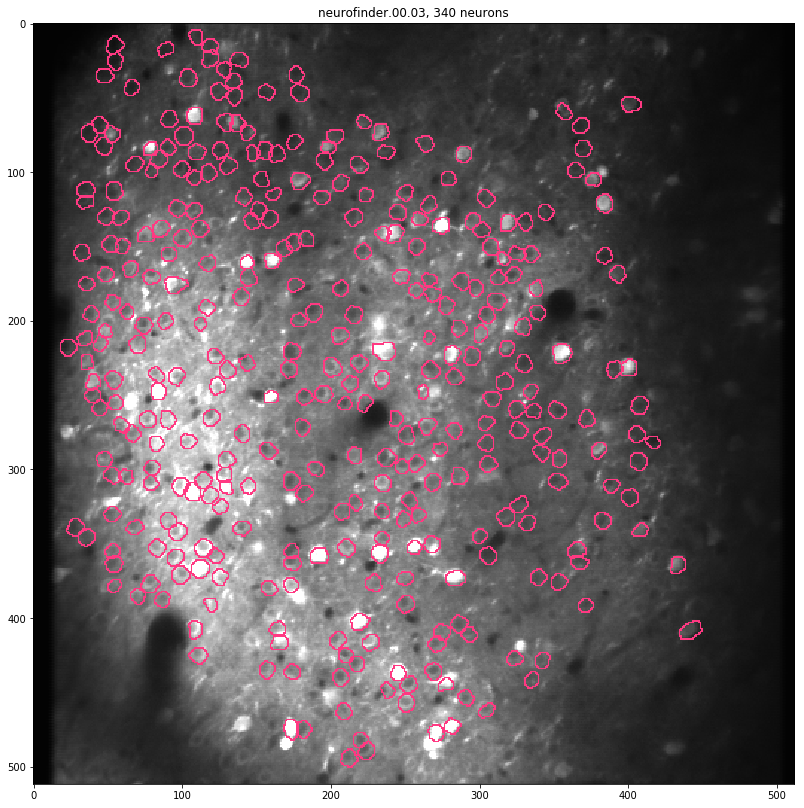

neurofinder.00.04


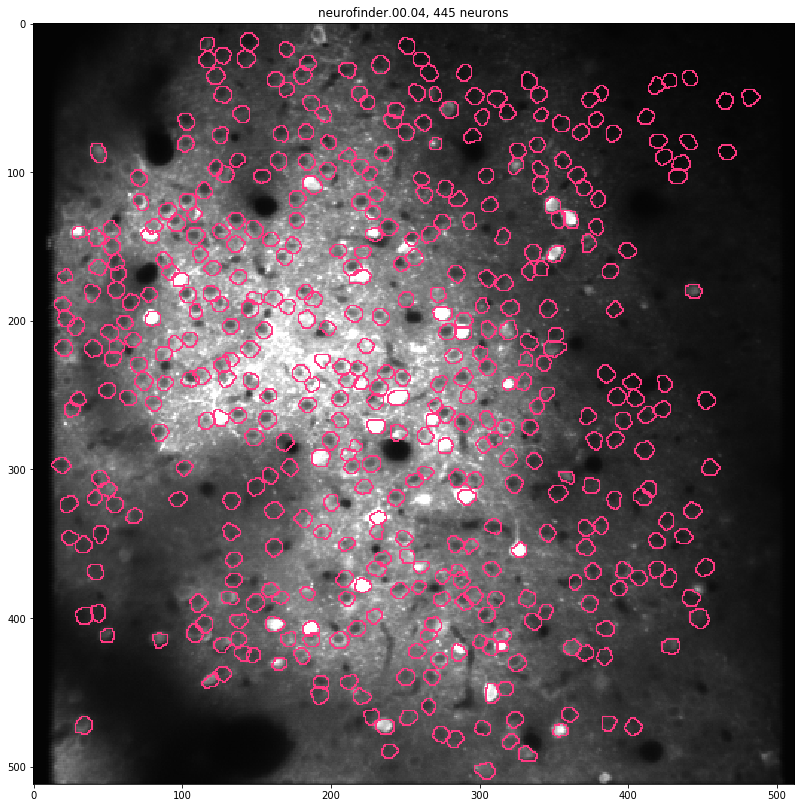

neurofinder.00.05


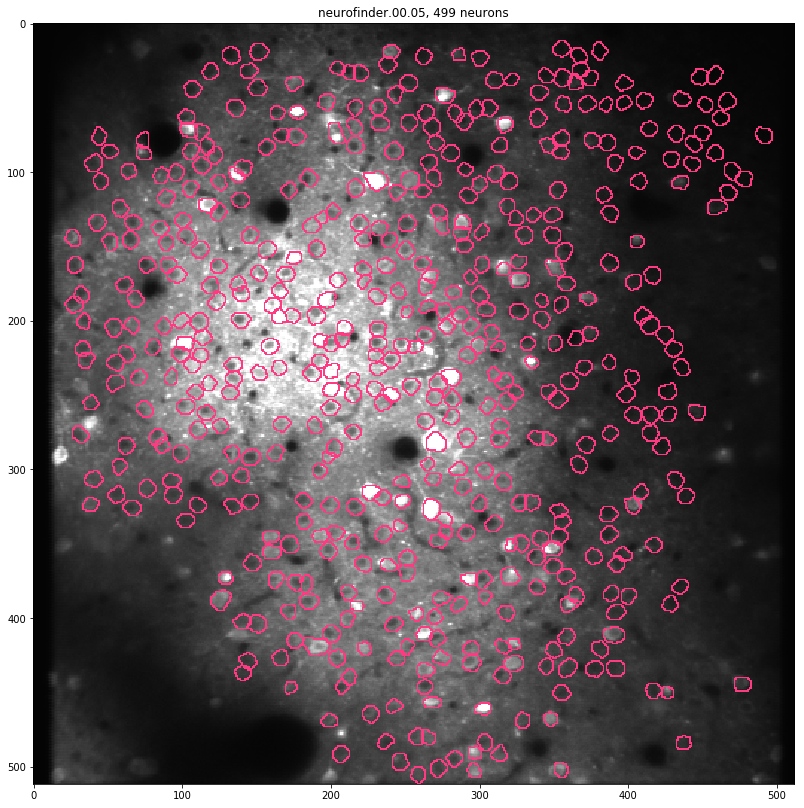

neurofinder.00.06


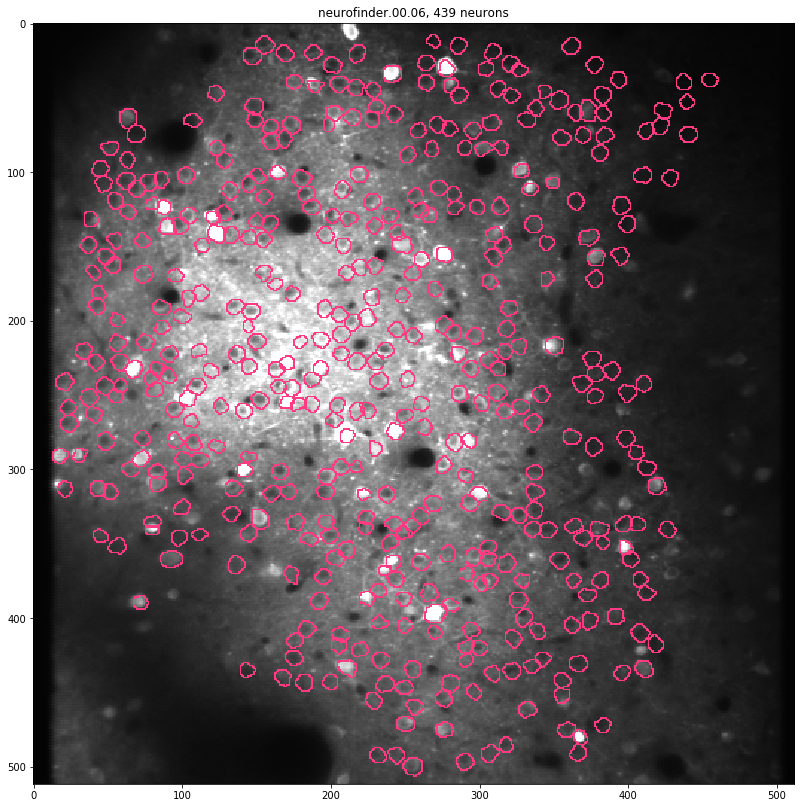

neurofinder.00.07


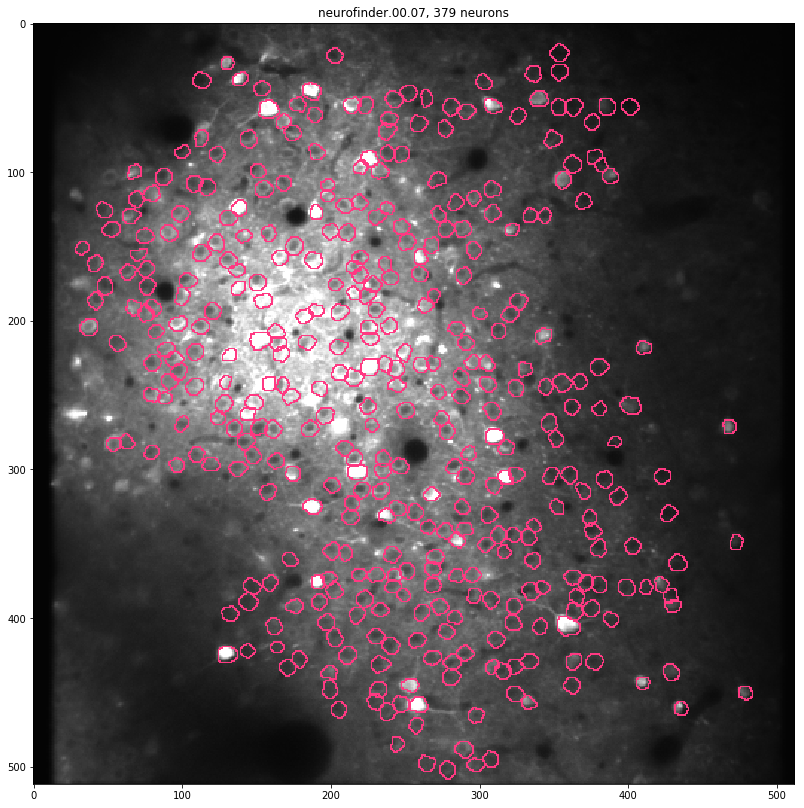

neurofinder.00.08


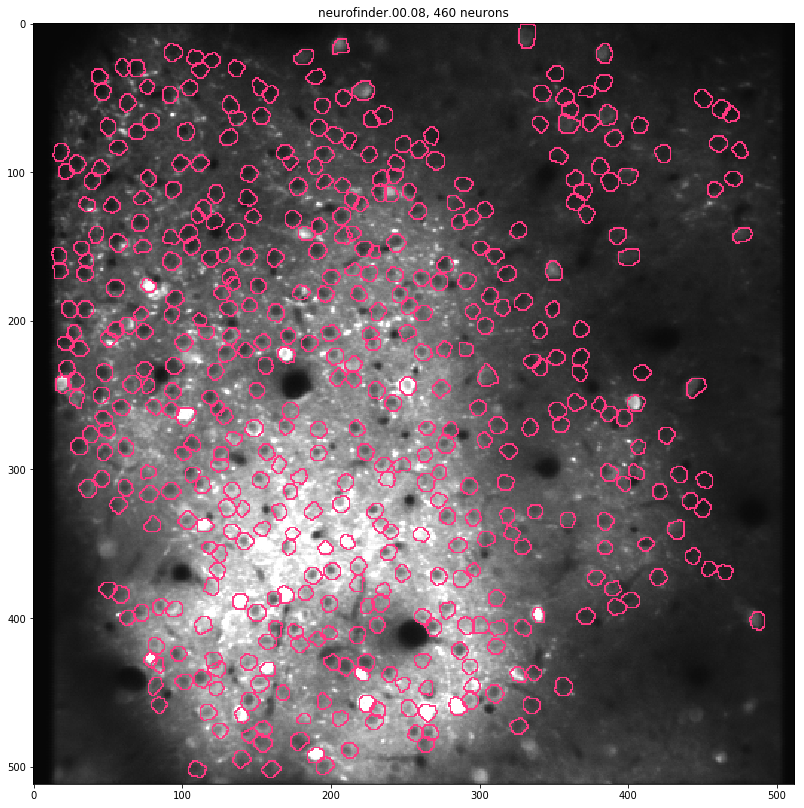

neurofinder.00.09


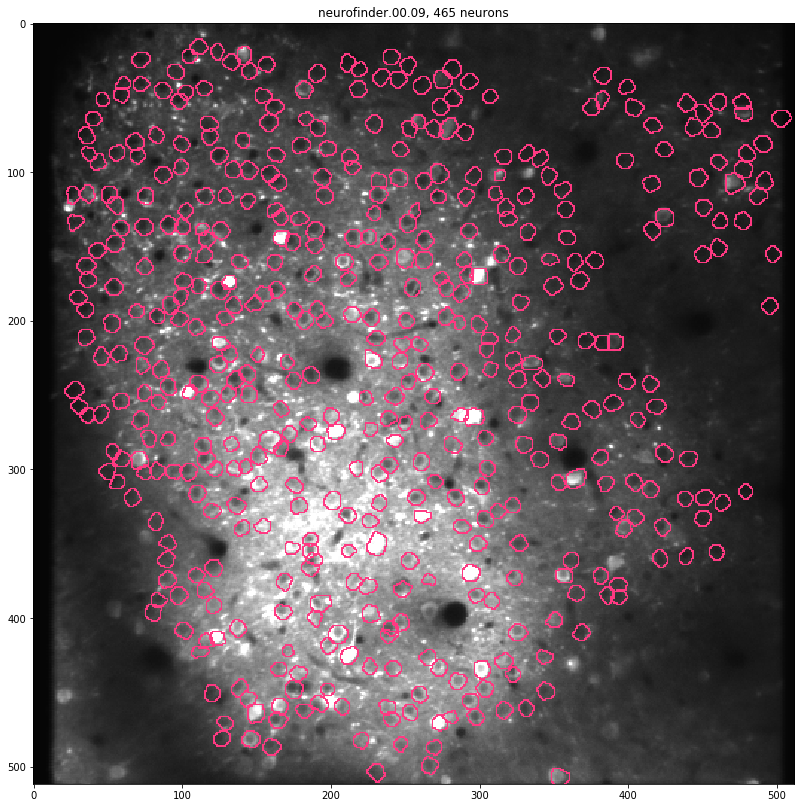

neurofinder.00.10


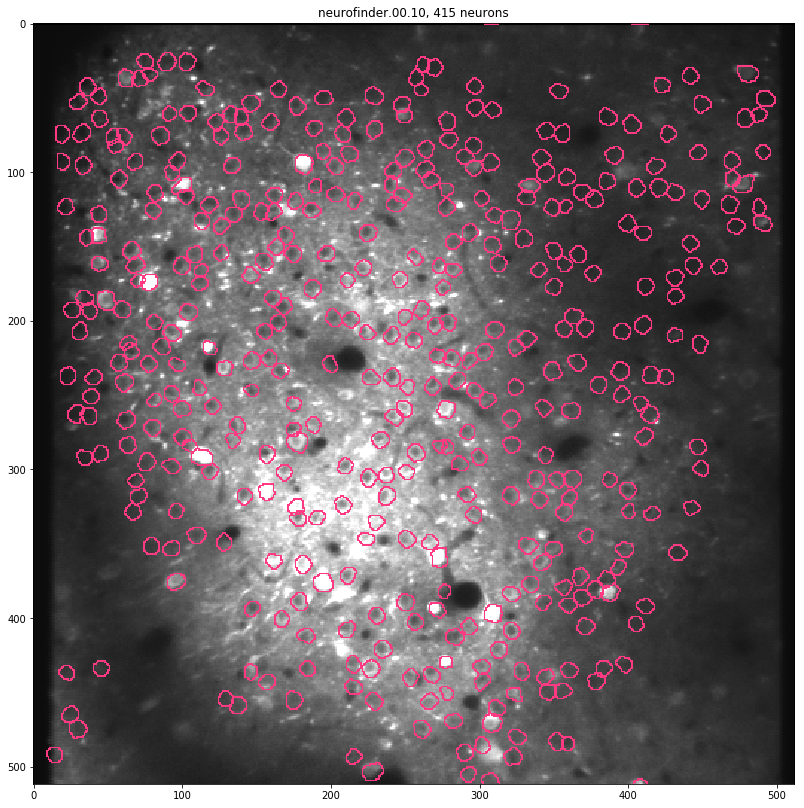

neurofinder.00.11


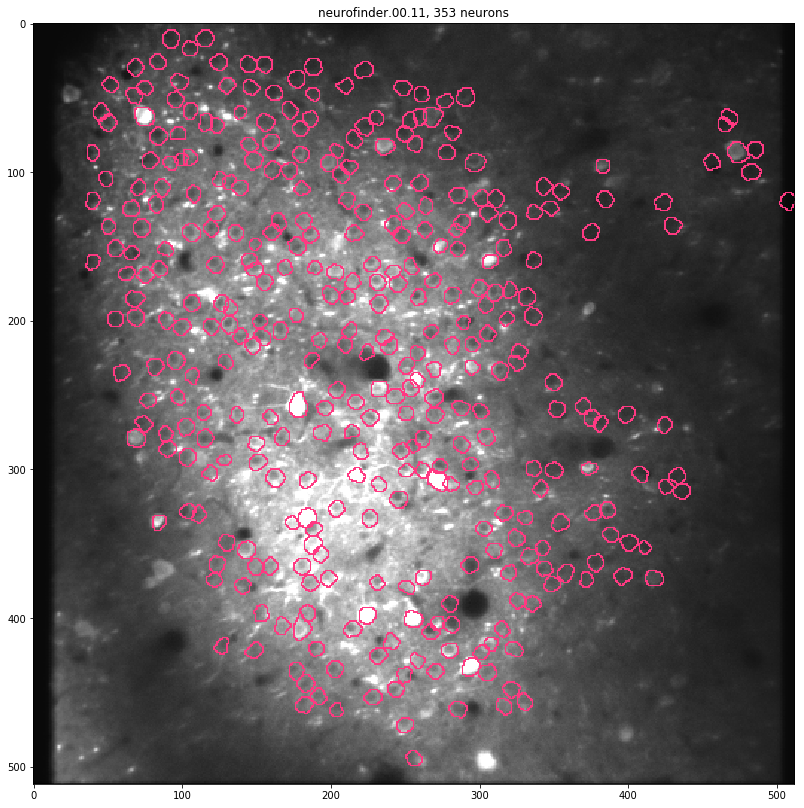

neurofinder.01.00


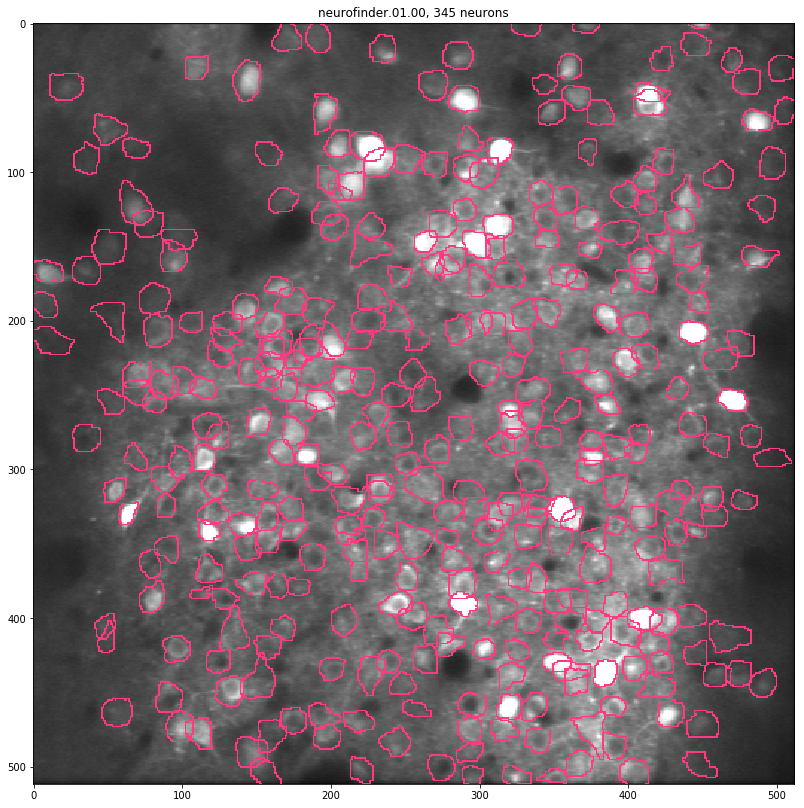

neurofinder.01.00.test


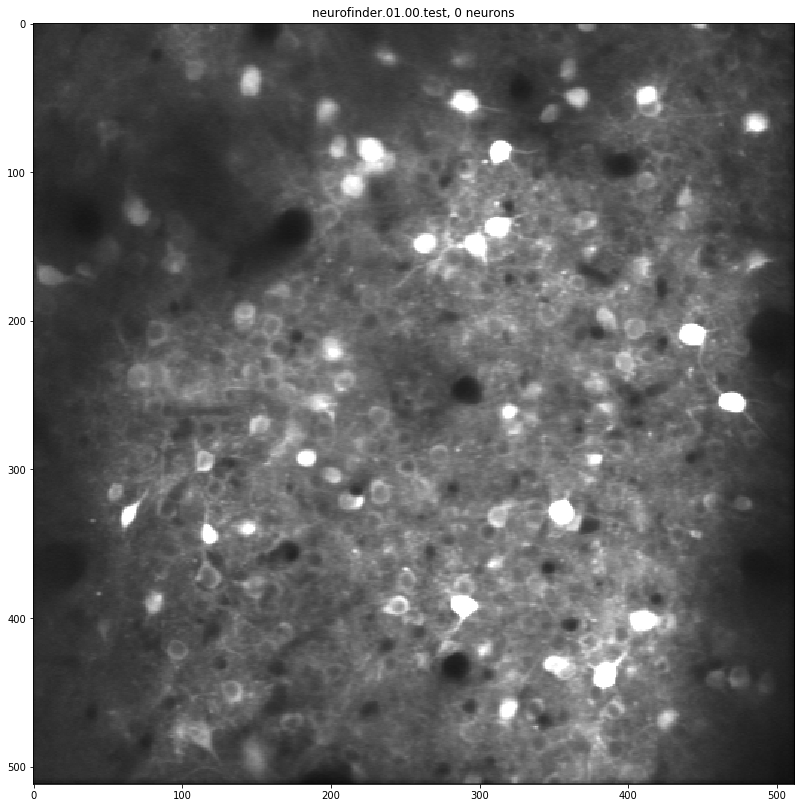

neurofinder.01.01


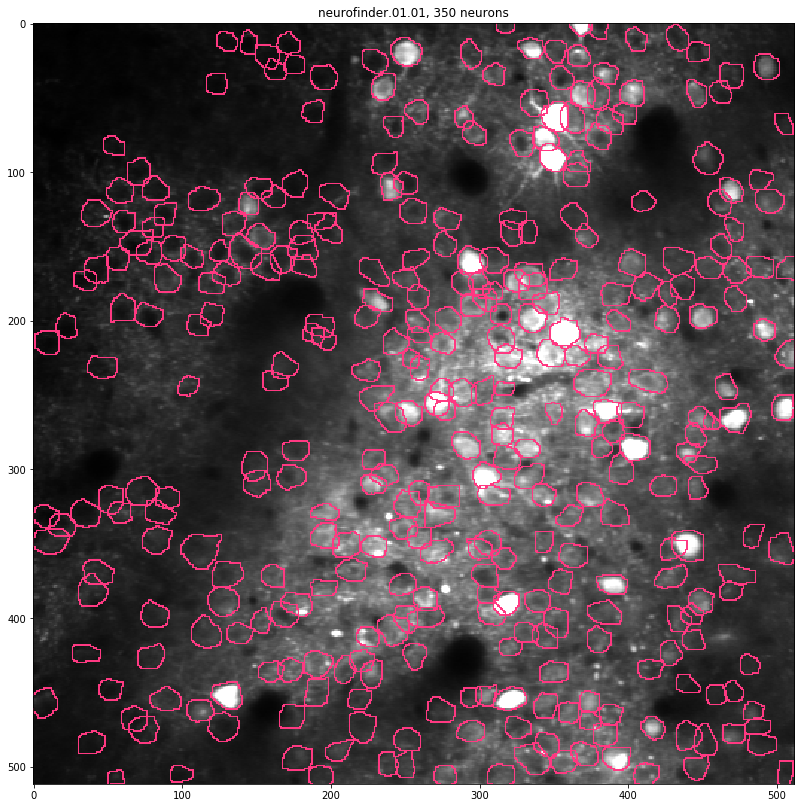

neurofinder.01.01.test


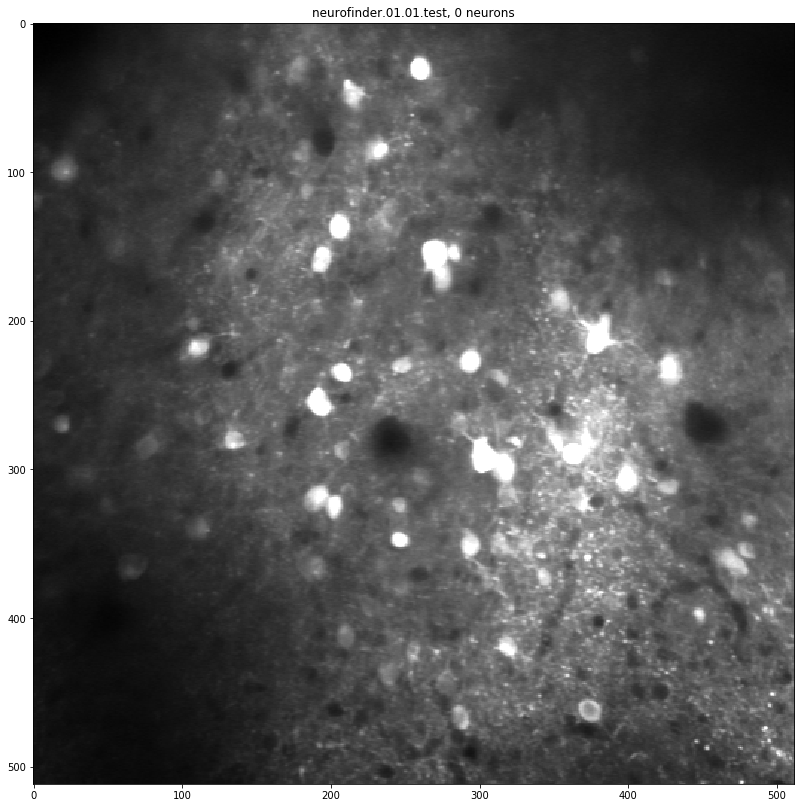

neurofinder.02.00


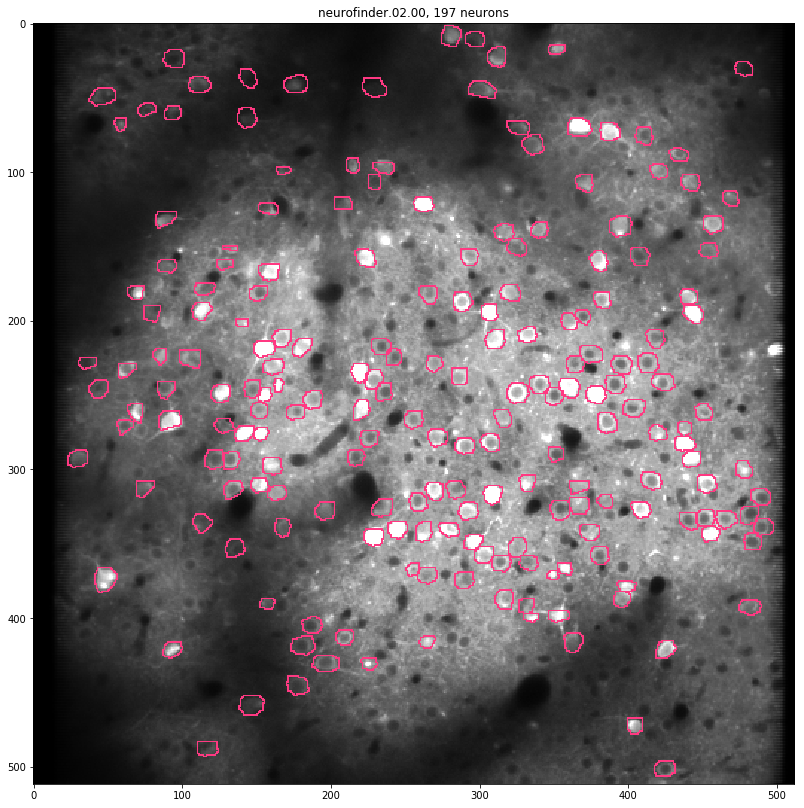

neurofinder.02.00.test


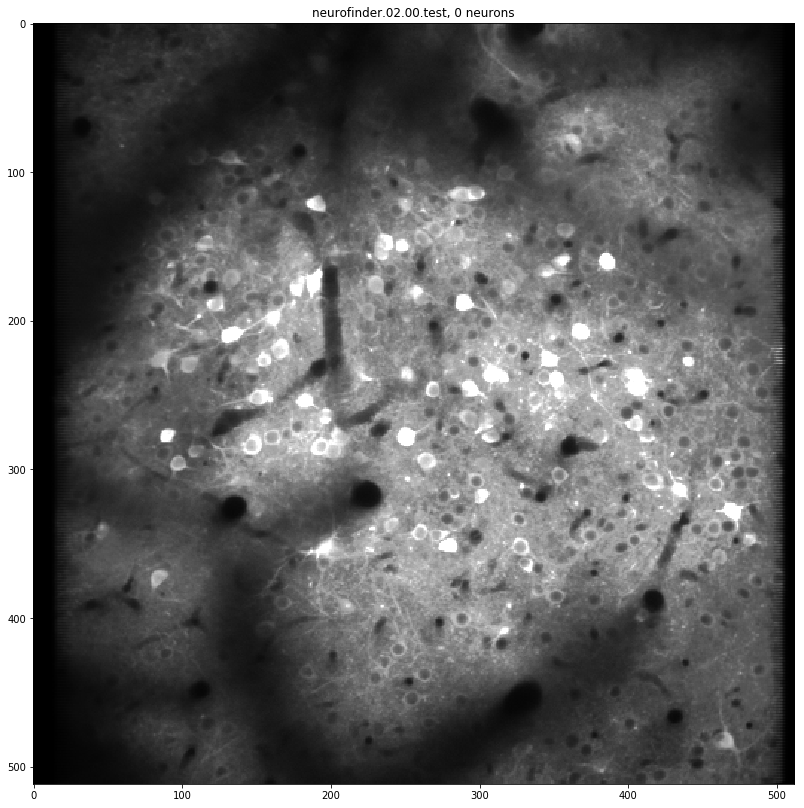

neurofinder.02.01


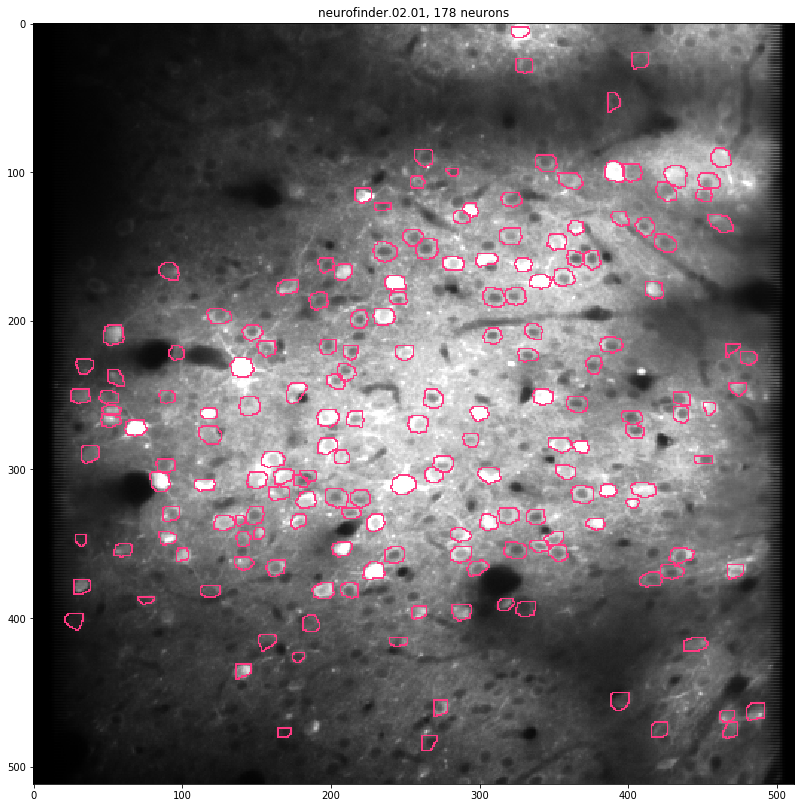

neurofinder.02.01.test


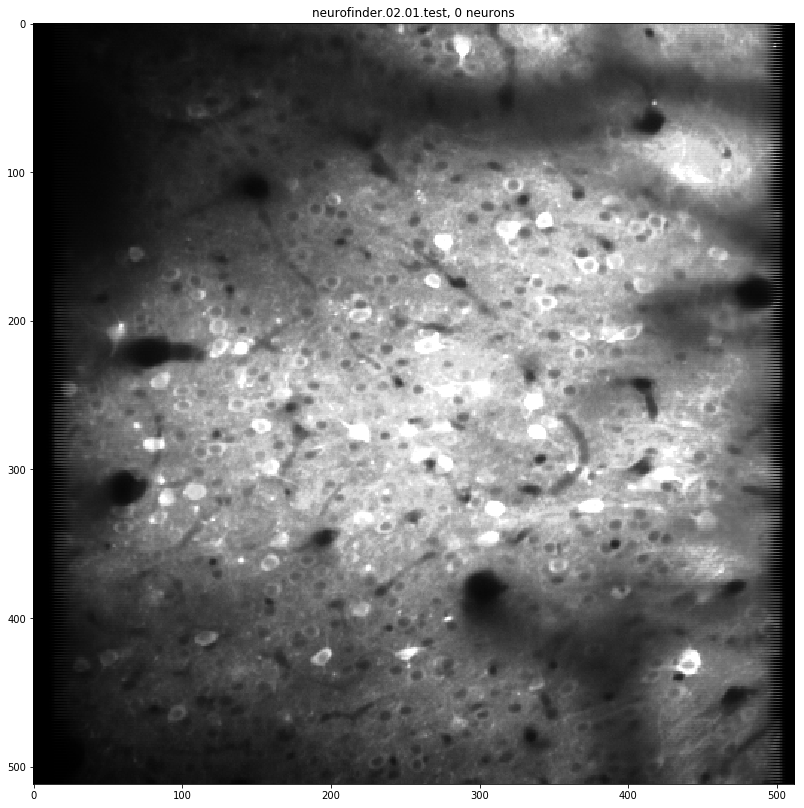

neurofinder.03.00


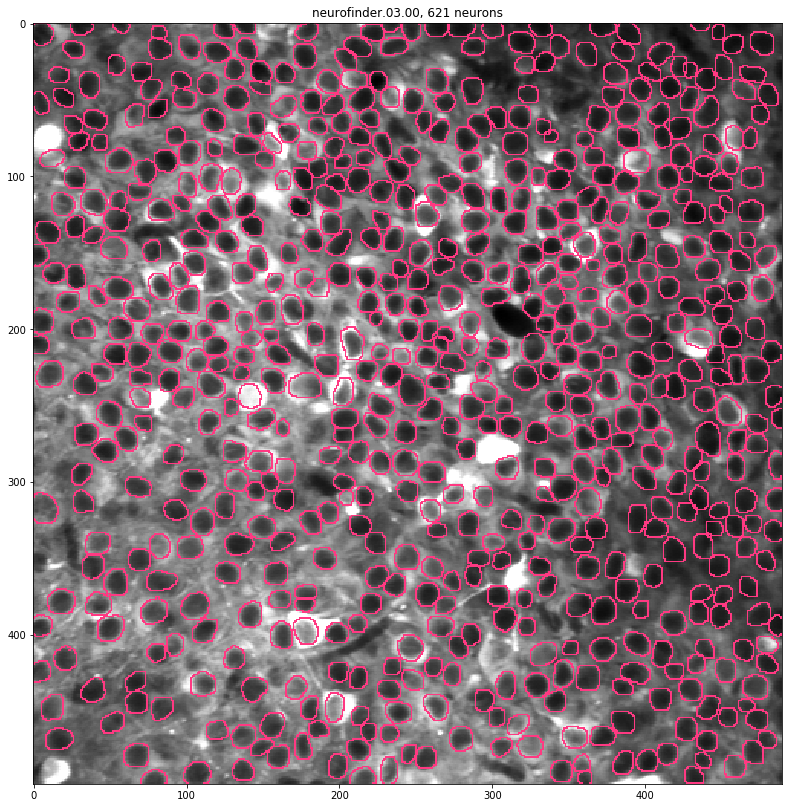

neurofinder.03.00.test


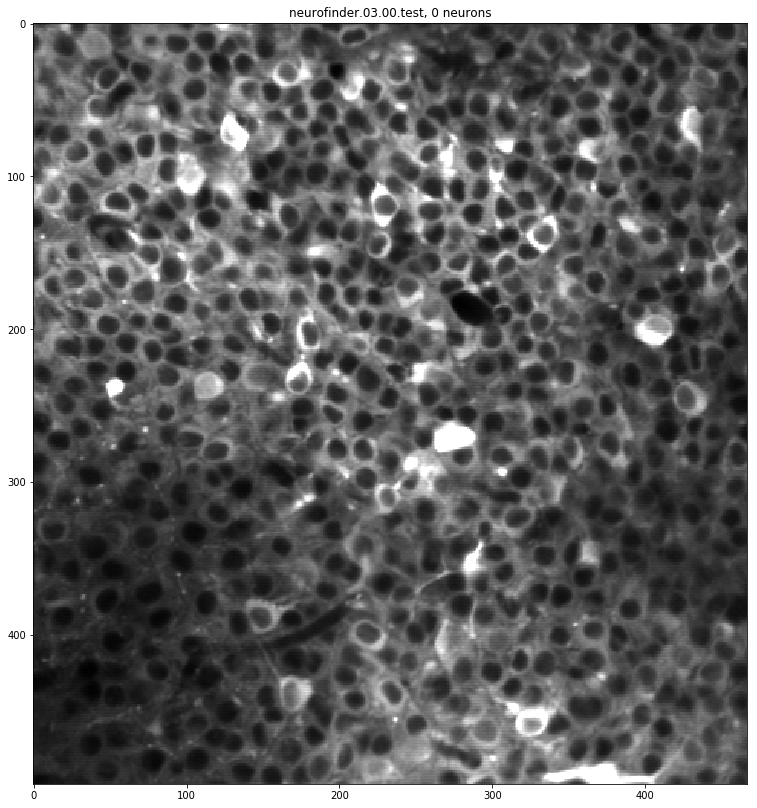

neurofinder.04.00


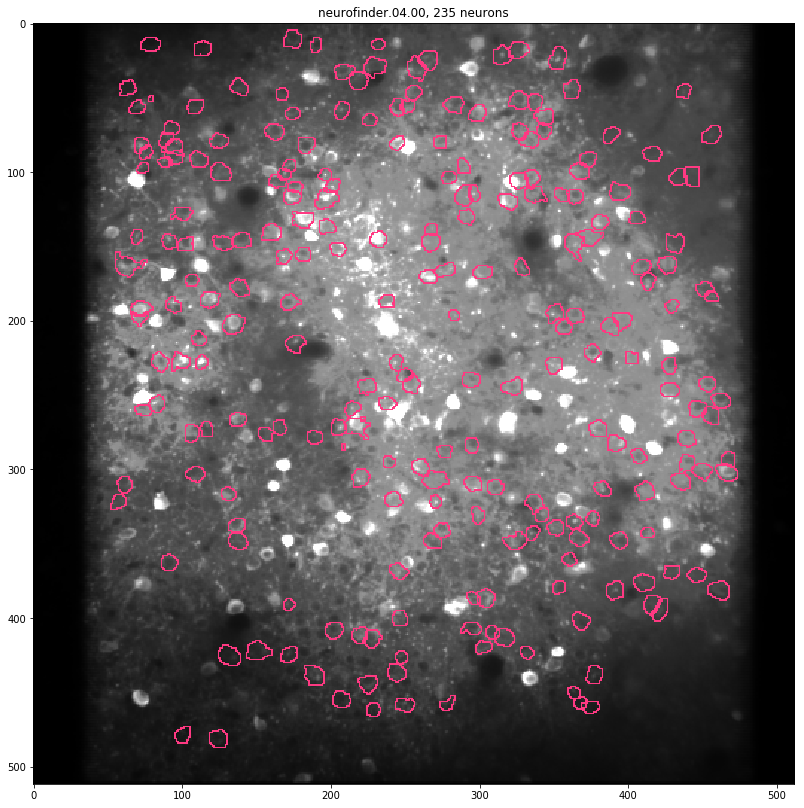

neurofinder.04.00.test


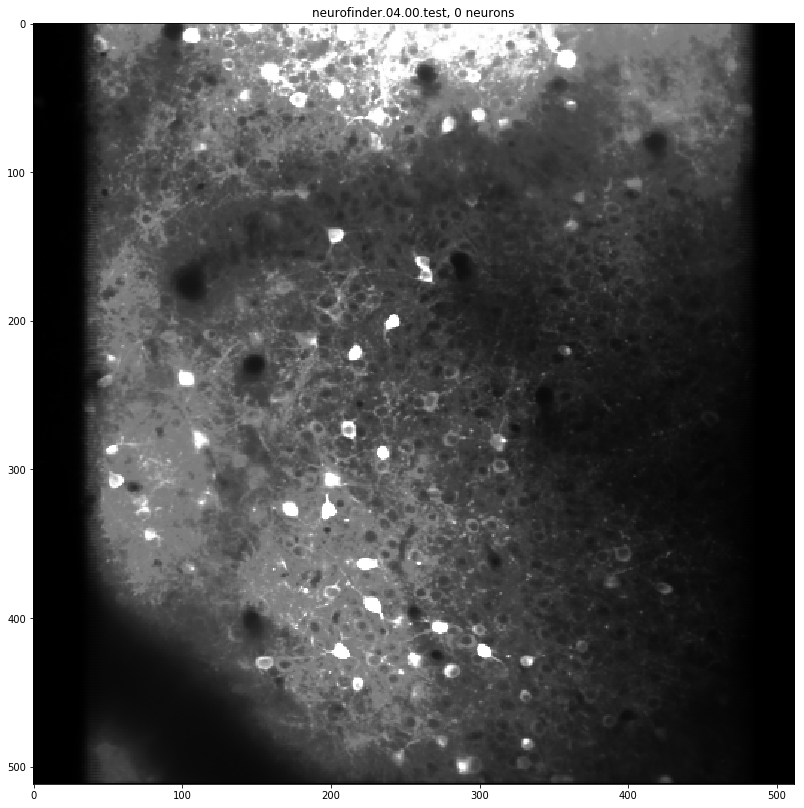

neurofinder.04.01


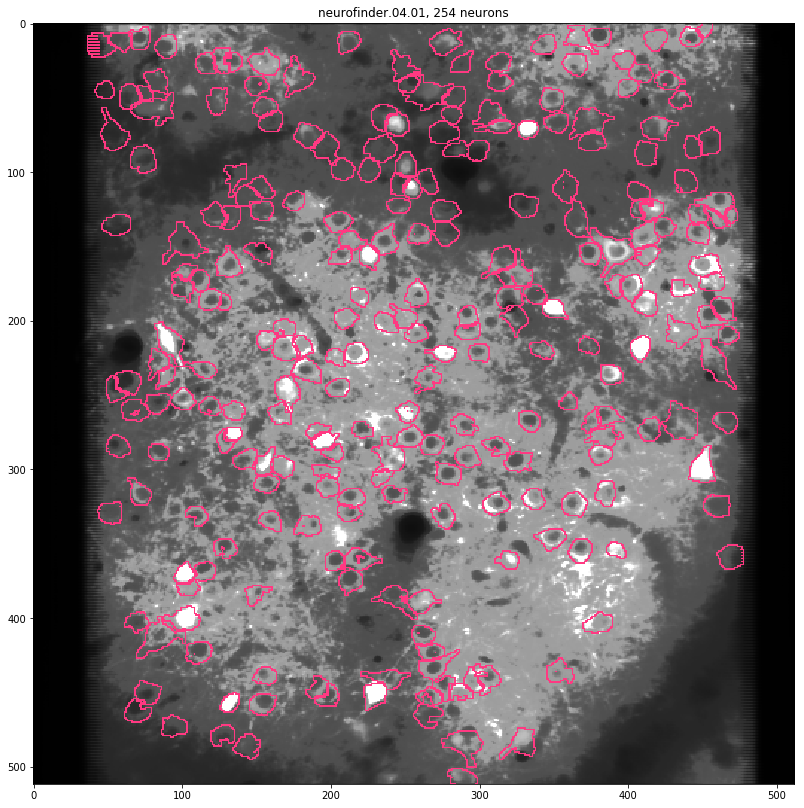

neurofinder.04.01.test


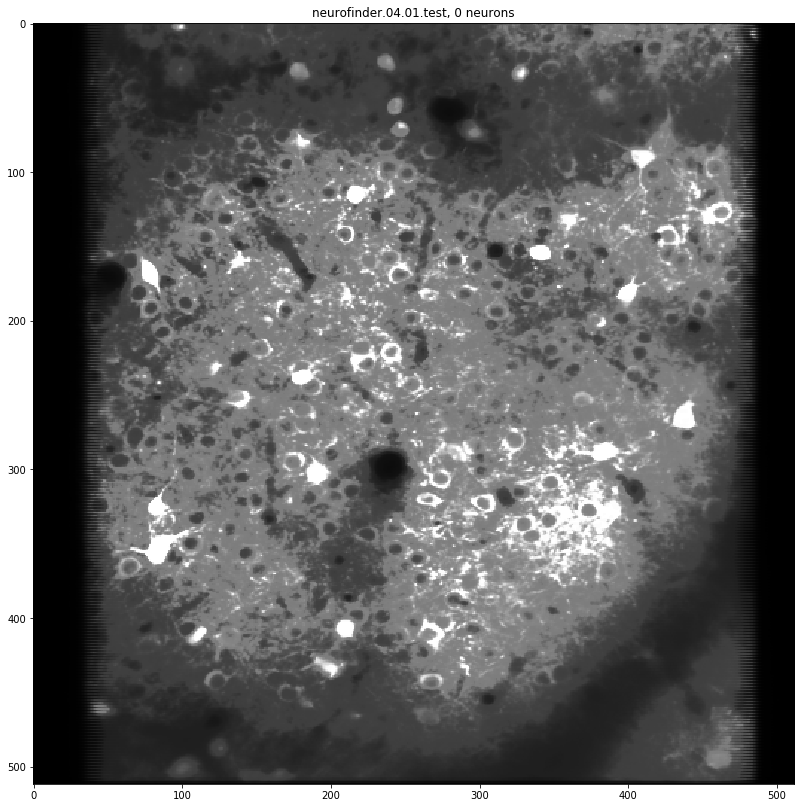

In [11]:
# Training set mean summaries with masks, testing without masks.
datasets = nf_load_hdf5('all', DATASETS_DIR)
for ds in datasets:
    print(ds.attrs['name']) # ctrl-F friendly.
    plt.figure(figsize=(14,14))
    if 'masks/raw' in ds:
        masks = ds.get('masks/raw')[...]
        colors = [(141,32,72)] * len(masks)
    else:
        masks, colors = [], []
        
    outlined = mask_outlines(ds.get('series/mean')[...], masks, colors)
    plt.title('%s, %d neurons' % (ds.attrs['name'], len(masks)))
    plt.imshow(outlined.astype('float32'))
    plt.show()
    ds.close()